# Notebook 02.4: Descriptive analysis

### Introduction

In this notebook, we will perform descriptive analysis on the transformed sample data obtained in the previous notebook. Descriptive analysis involves exploring and summarizing the data to gain insights into the distribution, relationships, and patterns of the variables.

### Setup

Let's start by importing the necessary libraries.


In [19]:
from collections import Counter

import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
from nltk import ngrams
from plotly.subplots import make_subplots
from wordcloud import WordCloud


### Data Loading
Let's load the transformed sample data from the previous notebook.

In [20]:
df = pd.read_csv("./data/transform_sample_data.csv")
df.head()

,password,strength,len,alphaUC,alphaLC,number,symbol,midChar,repChar,uniqueChar,consecAlphaUC,consecAlphaLC,consecNumber,consecSymbol,seqAlpha,seqNumber,seqKeyboard
0,csillik,0.180594,7,0,7,0,0,0,2,5,0,1,0,0,0,0,0
1,huniihuu,0.177778,8,0,8,0,0,0,4,4,0,2,0,0,0,0,0
2,chaipy,0.172331,6,0,6,0,0,0,0,6,0,0,0,0,0,0,0
3,876876b,0.155556,7,0,1,6,0,5,3,4,0,0,0,0,0,1,0
4,miiwhy,0.154795,6,0,6,0,0,0,1,5,0,1,0,0,0,0,0


### Data Information
Let's examine the information of the transformed sample data.

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   password       10000 non-null  object 
 1   strength       10000 non-null  float64
 2   len            10000 non-null  int64  
 3   alphaUC        10000 non-null  int64  
 4   alphaLC        10000 non-null  int64  
 5   number         10000 non-null  int64  
 6   symbol         10000 non-null  int64  
 7   midChar        10000 non-null  int64  
 8   repChar        10000 non-null  int64  
 9   uniqueChar     10000 non-null  int64  
 10  consecAlphaUC  10000 non-null  int64  
 11  consecAlphaLC  10000 non-null  int64  
 12  consecNumber   10000 non-null  int64  
 13  consecSymbol   10000 non-null  int64  
 14  seqAlpha       10000 non-null  int64  
 15  seqNumber      10000 non-null  int64  
 16  seqKeyboard    10000 non-null  int64  
dtypes: float64(1), int64(15), object(1)
memory usage: 1

### Descriptive Statistics for Numerical Columns
We will generate descriptive statistics for the numerical columns in the dataset, including measures of central tendency, dispersion, skewness, kurtosis, range, interquartile range (IQR), and the count of outliers.

In [22]:
def describe_numerical(df: pd.DataFrame) -> pd.DataFrame:
    """Generates descriptive statistics for numerical columns in a DataFrame, including measures of central tendency, dispersion, skewness, kurtosis, range, interquartile range (IOR), and identifies outliers.

    Args:
        df (pd.DataFrame): The input DataFrame containing numerical columns.

    Returns:
        pd.DataFrame: A DataFrame containing descriptive statistics for the numerical columns, including measures of central tendency, dispersion, skewness, kurtosis, range, interquartile range (IOR), and the count of outliers for each numerical column.
    """
    _df = df.select_dtypes("number")
    stats = _df.describe()
    stats.loc["var"] = _df.var().tolist()
    stats.loc["skew"] = _df.skew().tolist()
    stats.loc["kurtosis"] = _df.kurtosis().tolist()
    stats.loc["range"] = stats.loc["max"] - stats.loc["min"]
    stats.loc["IOR"] = stats.loc["75%"] - stats.loc["25%"]
    stats.loc["lower_bound"] = stats.loc["25%"] - 1.5 * stats.loc["IOR"]
    stats.loc["upper_bound"] = stats.loc["75%"] + 1.5 * stats.loc["IOR"]
    outliers = (_df < stats.loc["lower_bound"]) | (_df > stats.loc["upper_bound"])
    outliers_count = outliers.sum()
    stats.loc["outliers"] = outliers_count.tolist()
    return stats

In [23]:
describe_numerical(df).T

,count,mean,std,min,25%,50%,75%,max,var,skew,kurtosis,range,IOR,lower_bound,upper_bound,outliers
strength,10000.0,0.484839,0.256372,0.044444,0.229774,0.471037,0.694474,0.99948,0.065726,0.124583,-1.347718,0.955035,0.4647,-0.467275,1.391523,0.0
len,10000.0,12.927400,5.953207,4.000000,8.000000,12.000000,16.000000,60.00000,35.440673,1.032867,2.196673,56.000000,8.0000,-4.000000,28.000000,115.0
alphaUC,10000.0,0.559700,2.435617,0.000000,0.000000,0.000000,0.000000,32.00000,5.932229,6.233278,46.990559,32.000000,0.0000,0.000000,0.000000,976.0
alphaLC,10000.0,9.129900,6.684152,0.000000,5.000000,8.000000,13.000000,58.00000,44.677894,0.743571,0.903054,58.000000,8.0000,-7.000000,25.000000,151.0
number,10000.0,3.177300,3.954571,0.000000,0.000000,2.000000,5.000000,48.00000,15.638629,2.153771,8.766552,48.000000,5.0000,-7.500000,12.500000,229.0
symbol,10000.0,0.060500,0.594033,0.000000,0.000000,0.000000,0.000000,36.00000,0.352875,34.532160,1742.066610,36.000000,0.0000,0.000000,0.000000,330.0
midChar,10000.0,2.545400,3.563034,0.000000,0.000000,1.000000,4.000000,47.00000,12.695208,2.670036,13.014520,47.000000,4.0000,-6.000000,10.000000,292.0
repChar,10000.0,3.543900,3.540131,0.000000,1.000000,3.000000,5.000000,53.00000,12.532526,2.697740,15.859663,53.000000,4.0000,-5.000000,11.000000,339.0
uniqueChar,10000.0,9.383500,3.534526,2.000000,6.000000,9.000000,12.000000,36.00000,12.492877,0.376441,-0.128453,34.000000,6.0000,-3.000000,21.000000,9.0
consecAlphaUC,10000.0,0.017400,0.164621,0.000000,0.000000,0.000000,0.000000,7.00000,0.027100,15.556556,415.209490,7.000000,0.0000,0.000000,0.000000,143.0


### Numerical Column List
Let's create a list of the numerical columns in the dataset.

In [24]:
num_columns = list(df.select_dtypes("number").columns)

Visualization: Numerical Variables
We will create subplots to visualize the distribution of each numerical variable using a box plot, violin plot, and histogram.

In [25]:
def plot_graph_numerical(data: pd.DataFrame) -> None:
    """Generates subplots for visualizing the distribution of a numerical variable using a box plot, violin plot, and histogram.

    Args:
        data (pd.DataFrame): The input DataFrame containing the numerical variable to be visualized.

    Returns:
        None (displays the generated subplots).
    """
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.1)

    fig.add_trace(go.Box(x=data, name="Box Plot", marker_color="#636EFA"), row=1, col=1)
    fig.add_trace(
        go.Violin(x=data, name="Violin Plot", marker_color="#EF553B"), row=2, col=1
    )
    fig.add_trace(
        go.Histogram(x=data, nbinsx=20, name="Histogram", marker_color="#00CC96"),
        row=3,
        col=1,
    )

    fig.update_layout(
        title=f"Univariate Analysis of the {data.name} Variable",
        xaxis_title=f"{data.name}",
        height=800,
        width=1000,
    )

    fig.show()

In [26]:
for num_column in num_columns:
    plot_graph_numerical(df[num_column])

### Visualization: Word Frequencies
We will create a subplot with a bar graph, word cloud, and least frequent n-grams to visualize word frequencies in the password column.

In [27]:
def plot_word_frequencies(
    df: pd.DataFrame, column_name: str, n: int = 1, top_n: int = 10, least_n: int = 10
) -> go.Figure:
    """Generates a subplot with a bar graph, word cloud, and least frequent n-grams for visualizing word frequencies in a text column of a DataFrame.

    Args:
        df (pd.DataFrame): The input DataFrame containing the text column.
        column_name (str): The name of the column in the DataFrame containing the text data.
        n (int, optional): The size of n-grams to consider. Defaults to 1 (individual words).
        top_n (int, optional): The number of most frequent n-grams to include in the bar graph. Defaults to 10.
        least_n (int, optional): The number of least frequent n-grams to include in the bar graph. Defaults to 10.

    Returns:
        go.Figure: A go.Figure object representing the generated subplot.
    """
    words = df[column_name]

    # Create n-grams
    ngram_list = []
    for word in words:
        ngrams_word = ngrams(word, n)
        ngram_list.extend("".join(ngram) for ngram in ngrams_word)

    # Count frequency of n-grams
    freq = Counter(ngram_list)
    freq_sorted = dict(sorted(freq.items(), key=lambda x: x[1], reverse=True))

    # Create horizontal bar graph
    top_freq = dict(list(freq_sorted.items())[:top_n])
    least_freq = dict(list(freq_sorted.items())[-least_n:])
    rank_top = range(1, len(top_freq) + 1)
    rank_least = range(len(ngram_list) - least_n + 1, len(ngram_list) + 1)
    bar_fig = go.Figure(
        data=[
            go.Bar(
                y=list(top_freq.keys()),
                x=list(top_freq.values()),
                orientation="h",
                text=[f"Rank: {r}" for r in rank_top],
                textposition="inside",
                name="Most Frequent",
            )
        ]
    )
    bar_fig.update_layout(title=f"Top {top_n} {n}-grams")
    least_bar_fig = go.Figure(
        data=[
            go.Bar(
                y=list(least_freq.keys()),
                x=list(least_freq.values()),
                orientation="h",
                text=[f"Rank: {r}" for r in rank_least],
                textposition="inside",
                name="Least Frequent",
            )
        ]
    )
    least_bar_fig.update_layout(title=f"Least {least_n} {n}-grams")

    # Create wordcloud
    wordcloud = WordCloud(
        width=800, height=1500, background_color="white"
    ).generate_from_frequencies(freq)
    word_fig = px.imshow(wordcloud)
    word_fig.update_layout(title=f"{n}-gram Wordcloud")

    # Create subplot with bar graph and wordcloud
    fig = make_subplots(
        rows=1, cols=3, specs=[[{"type": "bar"}, {"type": "bar"}, {"type": "heatmap"}]]
    )
    fig.add_trace(bar_fig.data[0], row=1, col=1)
    fig.add_trace(least_bar_fig.data[0], row=1, col=2)
    fig.add_trace(word_fig.data[0], row=1, col=3)
    fig.update_layout(
        title=f"{n}-gram Frequencies and Wordcloud", width=1200, height=600
    )
    fig.update_xaxes(title_text="Frequency")

    bar_fig.update_layout(
        height=500,
        width=400,
        margin=dict(l=10, r=10, t=40, b=10),
        paper_bgcolor="white",
        plot_bgcolor="white",
    )
    least_bar_fig.update_layout(
        height=500,
        width=400,
        margin=dict(l=10, r=10, t=40, b=10),
        paper_bgcolor="white",
        plot_bgcolor="white",
    )
    word_fig.update_layout(
        height=500,
        width=600,
        margin=dict(l=10, r=10, t=40, b=10),
        paper_bgcolor="white",
        plot_bgcolor="white",
    )
    bar_fig.update_yaxes(autorange="reversed")
    least_bar_fig.update_yaxes(autorange="reversed")
    least_bar_fig.update_yaxes(autorange="reversed")
    return fig


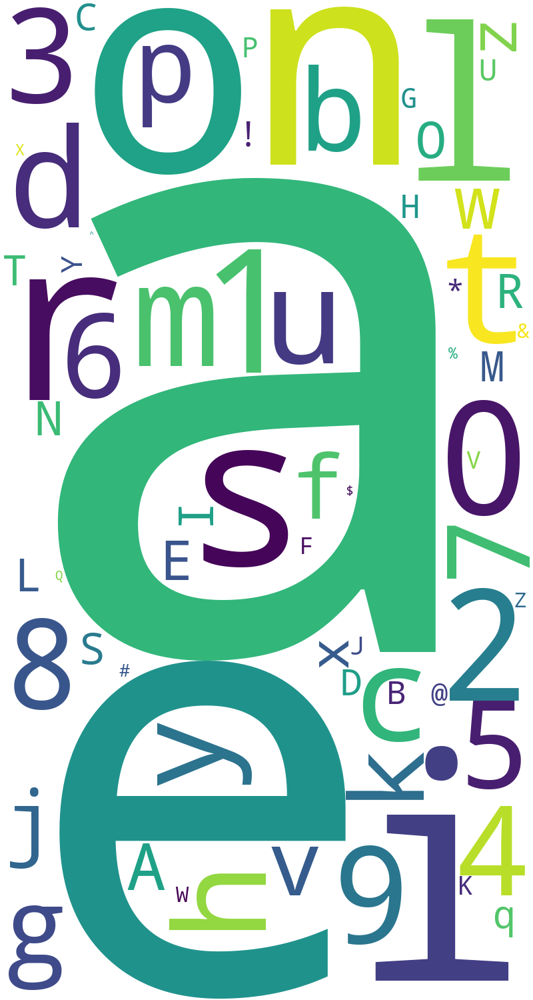

In [28]:
plot_word_frequencies(df, "password")


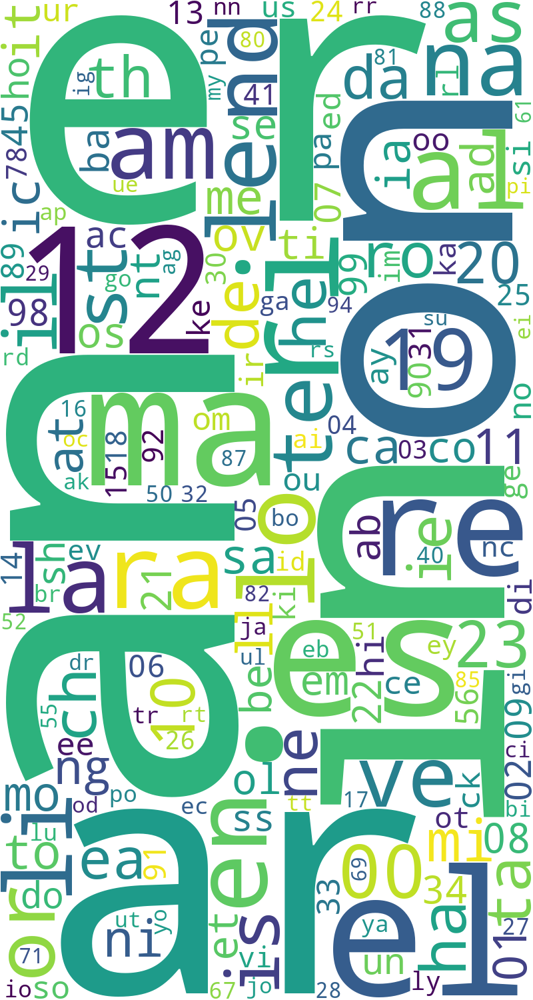

In [29]:
plot_word_frequencies(df, "password", n=2)


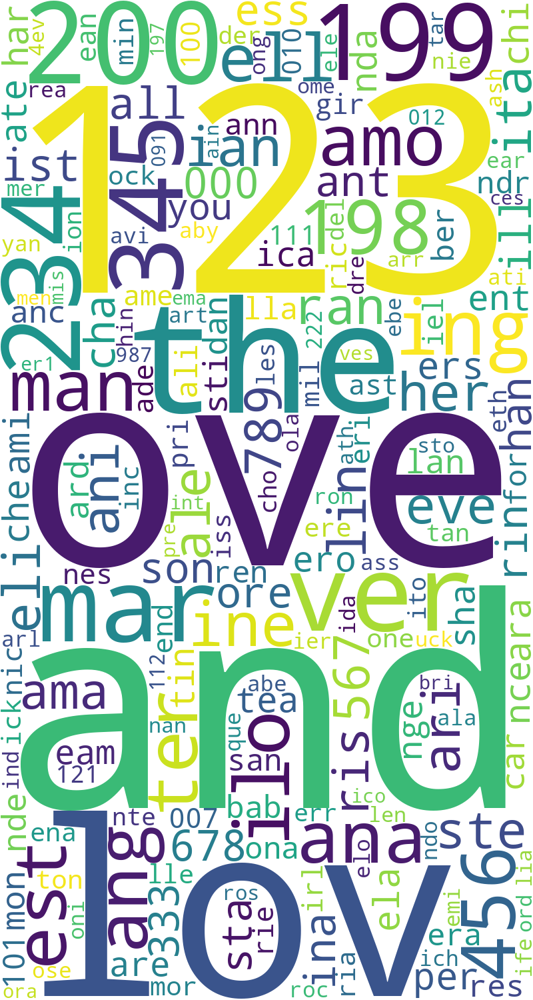

In [30]:
plot_word_frequencies(df, "password", n=3)


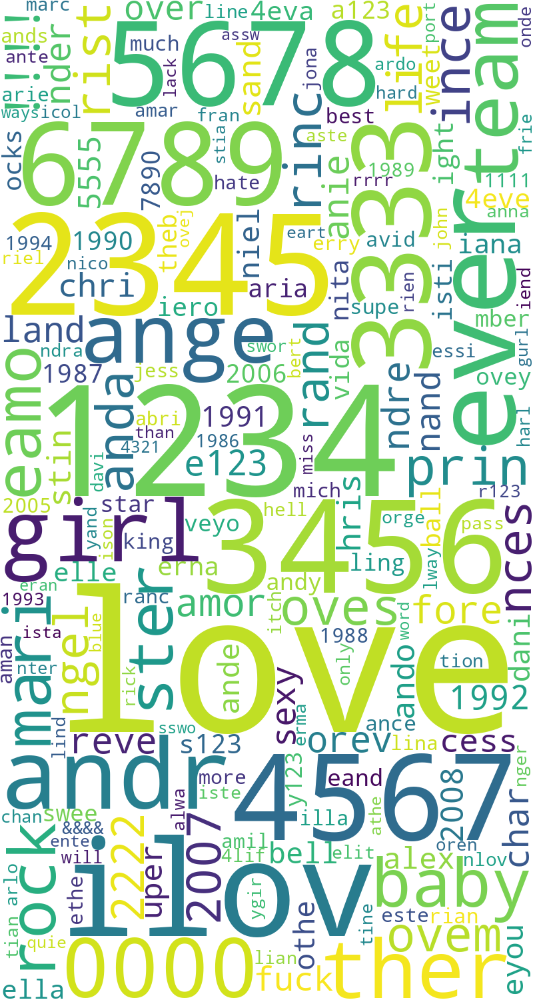

In [31]:
plot_word_frequencies(df, "password", n=4)


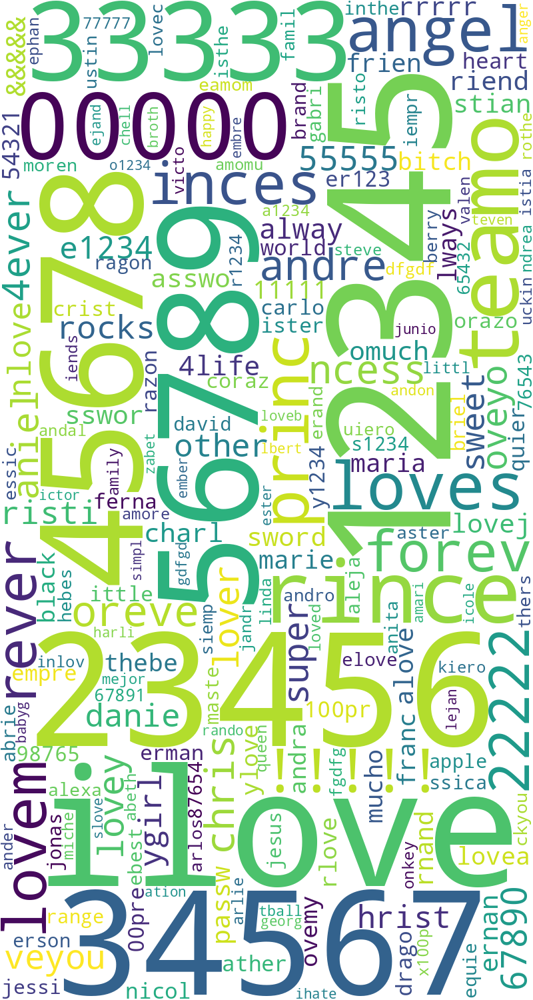

In [32]:
plot_word_frequencies(df, "password", n=5)

### Pair Plot
We will create a pair plot to visualize pairwise relationships between numerical columns.

In [33]:
def create_pair_plot(data: pd.DataFrame, num_columns: list[str]) -> go.Figure:
    """Creates a pair plot to visualize pairwise relationships between numerical columns in a DataFrame.

    Args:
        data (pd.DataFrame): The input DataFrame containing the numerical columns.
        num_columns (list[str]): A list of column names representing the numerical columns to include in the pair plot.

    Returns:
        go.Figure: A go.Figure object representing the generated pair plot.
    """
    return px.scatter_matrix(data, dimensions=num_columns, width=2000, height=2000)

In [34]:
create_pair_plot(df, num_columns)

/mnt/d/Code/Python/AI/PassShield/env/lib/python3.10/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



### Correlation Heatmap
We will create a correlation heatmap to visualize the correlation between columns in the dataset.

In [35]:
def correlation_heatmap(df: pd.DataFrame) -> go.Figure:
    """Creates a correlation heatmap to visualize the correlation between columns in a DataFrame.

    Args:
        df (pd.DataFrame): The input DataFrame for which the correlation heatmap is to be generated.

    Returns:
        go.Figure: A go.Figure object representing the correlation heatmap.
    """

    # Compute correlation matrix
    corr_matrix = df.corr()

    # Create heatmap
    fig = px.imshow(
        corr_matrix,
        color_continuous_scale="RdBu_r",
        x=corr_matrix.columns,
        y=corr_matrix.columns,
    )

    # Customize axes labels
    fig.update_xaxes(title=None, side="top")
    fig.update_yaxes(title=None, autorange="reversed")
    fig.update_layout(
        title="Correlation heatmap",
        height=1000,
        width=1000,
    )

    # Return the figure
    return fig

In [36]:
correlation_heatmap(df[num_columns])

🎉Congratulations! We have successfully performed descriptive analysis on the transformed sample data, gaining insights into the distribution, relationships, and patterns of the variables.

Next, let's move on to the next notebook to build our password strength prediction model.